<a href="https://colab.research.google.com/github/Lefkios/person-suppression-patch/blob/main/PersonDetectionAttack.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Install Ultralytics YOLOv8
!pip install ultralytics

!pip install kornia
!pip install torch torchvision matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 98.5 MB/s eta 0:00:00


In [3]:
!pip install -q ultralytics opencv-python pillow

##Create the Learnable Patch

In [4]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
patch_size = (80, 80)

# Learnable patch initialized with random values
patch = torch.rand(3, *patch_size, device=device, requires_grad=True)

# Setup optimizer
optimizer = torch.optim.Adam([patch], lr=0.05)

print(f"Patch shape: {patch.shape} | Device: {device}")


Patch shape: torch.Size([3, 80, 80]) | Device: cuda


In [5]:
import torch
import torch.nn.functional as F

def gaussian_soft_mask(h, w, device, dtype, edge_frac=0.04):
    yy = torch.linspace(-1, 1, h, device=device, dtype=dtype).unsqueeze(1).expand(h, w)
    xx = torch.linspace(-1, 1, w, device=device, dtype=dtype).unsqueeze(0).expand(h, w)
    rr = torch.max(xx.abs(), yy.abs())
    edge_start = 1.0 - edge_frac * 2.0
    mask = (1.0 - (rr - edge_start) / (1.0 - edge_start)).clamp(0, 1)
    return mask.unsqueeze(0)  # 1xHxW


## Add Patch to Image

### Overlay Patch on Person

This function pastes the adversarial patch onto a person’s **torso area** inside the bounding box.  
Steps:
- Rescales the patch to fit the person (based on bbox width).
- Places it at chest height (`torso_rel_y` ≈ 0.55).
- Uses a **soft mask** so edges blend smoothly.
- Pads/clips if the patch goes outside the image.

**Returns:**  
- Patched image  
- Mask used for blending  
- Final rectangle where the patch was applied


In [6]:
def overlay_patch_on_person_DIFF(
    image_tensor, patch_tensor, bbox_xywh, orig_size,
    size_ratio_w=0.5, torso_rel_y=0.55, soft_edge_frac=0.04
):
    C, Himg, Wimg = image_tensor.shape
    W0, H0 = orig_size
    x, y, w, h = bbox_xywh

    sx, sy = Wimg / float(W0), Himg / float(H0)
    x_s, y_s, w_s, h_s = x*sx, y*sy, w*sx, h*sy

    side = max(6, int(round(w_s * size_ratio_w)))
    p_res = F.interpolate(patch_tensor.unsqueeze(0), size=(side, side),
                          mode='bilinear', align_corners=False)[0]

    cx = x_s + 0.5*w_s
    cy = y_s + torso_rel_y*h_s
    x0 = int(round(cx - side/2.0))
    y0 = int(round(cy - side/2.0))

    left_pad   = max(0, -x0)
    top_pad    = max(0, -y0)
    right_pad  = max(0, (x0 + side) - Wimg)
    bottom_pad = max(0, (y0 + side) - Himg)

    x0c = x0 + left_pad
    y0c = y0 + top_pad

    p_pad = F.pad(p_res, (left_pad, right_pad, top_pad, bottom_pad))
    mask_small = gaussian_soft_mask(side, side, image_tensor.device, image_tensor.dtype, edge_frac=soft_edge_frac)
    mask_pad = F.pad(mask_small, (left_pad, right_pad, top_pad, bottom_pad))

    canvas  = torch.zeros_like(image_tensor)
    mcanvas = torch.zeros(1, Himg, Wimg, device=image_tensor.device, dtype=image_tensor.dtype)

    y1 = min(y0c + p_pad.shape[1], Himg)
    x1 = min(x0c + p_pad.shape[2], Wimg)
    canvas[:, y0c:y1, x0c:x1]  = p_pad[:, :y1-y0c, :x1-x0c]
    mcanvas[:, y0c:y1, x0c:x1] = mask_pad[:, :y1-y0c, :x1-x0c]

    patched = image_tensor * (1 - mcanvas) + canvas * mcanvas
    # Return rect = top-left + size on the resized image
    rect = (x0c, y0c, min(side, x1 - x0c), min(side, y1 - y0c))
    return patched, mcanvas, rect


# Load COCO yolov8n.pt


In [7]:
import torch
from ultralytics import YOLO

# Detect device (CPU αν δεν έχεις GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Load pretrained YOLOv8n (COCO)
model = YOLO("yolov8n.pt")
model.model.to(device).eval()

# Freeze weights (για inference / adversarial attack experiments)
for p in model.model.parameters():
    p.requires_grad_(False)

# Class names (COCO dataset)
names = model.model.names   # dict {0:'person',1:'bicycle',...}
name_to_id = {v: i for i, v in names.items()}
PERSON_ID = name_to_id["person"]

print("Loaded YOLOv8s pretrained (COCO). Class mapping:", names)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Device: cuda
Loaded YOLOv8s pretrained (COCO). Class mapping: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 

### Image Dataset

Loads all images from a folder, resizes them to `640×640`, and returns both the **resized tensor** and the **original size**.  
Used to feed images in batches (via DataLoader) for patch training and evaluation.  


In [13]:
import os
from pathlib import Path
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

class ImageFolder640(Dataset):
    def __init__(self, image_dir, extensions=(".jpg", ".png", ".jpeg")):
        self.image_dir = Path(image_dir)
        self.images = sorted([p for p in self.image_dir.glob("*") if p.suffix.lower() in extensions])

        # keep compatibility with code that expects dataset.paths
        self.paths = [str(p) for p in self.images]

        # Transforms: resize to 640×640, convert to tensor
        self.transform = T.Compose([
            T.Resize((640, 640)),
            T.ToTensor()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        img = Image.open(img_path).convert("RGB")

        # Store original size
        orig_size = img.size  # (W, H)

        # Apply transform
        img_resized = self.transform(img)

        return {
            "image": img_resized,      # Tensor [3, 640, 640]
            "orig_size": orig_size,    # (W, H)
            "path": str(img_path)      # optional: keep filename
        }


# Example usage:
if __name__ == "__main__":
    dataset = ImageFolder640("/content/drive/MyDrive/person_subset/images/train2017")
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    for batch in dataloader:
        print("Batch image tensor:", batch["image"].shape)  # [B, 3, 640, 640]
        print("Original sizes:", batch["orig_size"])
        break



Batch image tensor: torch.Size([8, 3, 640, 640])
Original sizes: [tensor([640, 500, 640, 640, 500, 640, 640, 612]), tensor([428, 500, 427, 444, 375, 466, 427, 612])]


#Helpers

In [14]:
def tv_loss(p):
    return (p[:,1:,:]-p[:,:-1,:]).abs().mean() + (p[:,:,1:]-p[:,:,:-1]).abs().mean()

def center_paste(img, patch, frac=0.34):
    C, H, W = img.shape
    size = max(6, int(frac * W))
    p = F.interpolate(patch.unsqueeze(0), size=(size, size),
                      mode='bilinear', align_corners=False)[0]
    y0 = (H - size) // 2; x0 = (W - size) // 2
    out = img.clone()
    out[:, y0:y0+size, x0:x0+size] = p
    return out

def jitter_intensity(p):
    mean = p.mean()
    b = 1.0 + torch.empty(1, device=p.device).uniform_(-0.05, 0.05)
    c = 1.0 + torch.empty(1, device=p.device).uniform_(-0.05, 0.05)
    return ((p - mean) * c + mean) * b

def forward_raw_anchors_first(x):
    """
    Ensure raw head is (B, N_anchors, no). Some builds output (B, no, N_anchors).
    """
    raw = model.model(x)[0]
    if raw.ndim != 3:
        raise RuntimeError(f"Unexpected head shape: {tuple(raw.shape)}")
    B, A, NO = raw.shape
    # If middle dim looks like 'no' (≈85) and last is large, transpose
    if A <= 128 and NO > 128:
        raw = raw.transpose(1, 2).contiguous()
    return raw  # (B, N_anchors, no)

def sample_paths(all_paths, k):
    if len(all_paths) >= k:
        return random.sample(all_paths, k)
    return [random.choice(all_paths) for _ in range(k)]




### Training Loop — Person Suppression

**Goal:** Learn a patch that **lowers YOLO’s person confidence** on the most affected anchors, while staying smooth/printable.

**Flow per step:**
1. Sample `BATCH` images → make **clean** and **patched** versions  
   - Torso paste if bbox available, else **center paste**.
2. Forward pass:
   - `log_score_c` = clean person log-score, `log_score_p` = patched.
3. **Top-K focus:** pick K anchors with highest `log_score_p` per image.
4. Loss =  
   - `MAIN_W·L_main` → average `log_score_p` on Top-K (push **down**).  
   - `REL_W·L_rel` → no-increase vs clean on same anchors.  
   - `TV_W·L_tv`  → **total variation** for smooth/printable patch.  
   - `L2_W·L_l2`  → small-magnitude prior.
5. Optimize `patch_var` (Adam), clamp to `[0,1]`, keep **best** patch.

**Notes:**
- `TOPK_FRAC` + `TOPK_MIN` keep training **stable** (K-safe).
- Logging prints loss terms, grad norm, and quick person counts on patched images.
- `SIZE_RATIO_W`, `TORSO_REL_Y` control patch size/torso placement.


1. Take a batch of images.

2. Make two copies of each: clean (no patch) and patched (with your patch pasted on the torso).

3. Run YOLO on both sets.

4. From the patched outputs, find the K loudest spots (anchors) that still think “this is a person.”

5. Compute a loss only on those K spots to push their “person” confidence down, and to not become worse than clean at those exact spots.

6. Add light TV/L2 regularization on the patch.

7. Backprop → update only the patch pixels → repeat.

In [17]:
# ==== Person-suppression adversarial patch (Top-K over anchors, K-safe) ====
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from PIL import Image
import numpy as np, random, math

# ---------------- config ----------------
STEPS = 500
BATCH = 8
IMG_SIZE = 640
SIZE_RATIO_W = 0.50
TORSO_REL_Y = 0.55

# Optimization
LR = 0.07
MAIN_W = 20.0   # weight for main suppression on top-K person anchors
REL_W  = 20.0   # weight for no-increase vs clean on those same anchors
TV_W   = 0.01
L2_W   = 0.0003

# Top-K selection (per image)
TOPK_FRAC = 1/20   # keep top ~5% anchors by person log-score
TOPK_MIN  = 100    # lower bound for K

# Logging
CONF_LOG    = 0.50
LOG_EVERY   = 25
LOG_SAMPLES = 4

# ---------------- prep (helpers are assumed to exist above) ----------------
assert ('dataset' in globals()) or ('image_paths' in globals()), "Provide 'dataset' or 'image_paths'."

# freeze model just in case & set eval
for p in model.model.parameters():
    p.requires_grad_(False)
model.model.eval()

device = next(model.model.parameters()).device
tf = T.Compose([T.Resize((IMG_SIZE, IMG_SIZE)), T.ToTensor()])

# IDs (support dict or list)
names = model.model.names
if isinstance(names, dict):
    name_to_id = {v: k for k, v in names.items()}
else:
    name_to_id = {v: i for i, v in enumerate(names)}
PERSON_ID = name_to_id["person"]

# ---------------- patch & optimizer ----------------
patch_var = (patch if 'patch' in globals() else torch.rand(3, 80, 80, device=device))
patch_var = patch_var.to(device).clone().detach().requires_grad_(True)

opt = torch.optim.Adam([patch_var], lr=LR)
best_loss = float('inf')
best_patch = patch_var.detach().cpu().clone()

paths_all = (dataset.paths if ('dataset' in globals() and hasattr(dataset, 'paths'))
             else image_paths)

# ---------------- training loop ----------------
for step in range(STEPS):
    batch_paths = sample_paths(paths_all, BATCH)

    imgs_clean, imgs_patched = [], []

    # Build batch with chest paste when possible
    for pth in batch_paths:
        with Image.open(pth) as pil:
            pil = pil.convert("RGB")
            img = tf(pil).to(device)  # 3x640x640

        t_patch = jitter_intensity(patch_var).clamp(0, 1)

        if 'bbox_cache' in globals():
            bbox, orig_size = bbox_cache.get(pth, (None, pil.size))
        else:
            bbox, orig_size = (None, pil.size)

        if (bbox is not None) and ('overlay_patch_on_person_DIFF' in globals()):
            res = overlay_patch_on_person_DIFF(
                img, t_patch, bbox, orig_size,
                size_ratio_w=SIZE_RATIO_W,
                torso_rel_y=TORSO_REL_Y,
                soft_edge_frac=0.04
            )
            patched = res[0] if isinstance(res, (tuple, list)) else res
        else:
            patched = center_paste(img, t_patch, frac=0.34)

        imgs_clean.append(img)
        imgs_patched.append(patched)

    imgs_clean   = torch.stack(imgs_clean,   0)  # Bx3x640x640
    imgs_patched = torch.stack(imgs_patched, 0)  # Bx3x640x640

    # ----- forward clean (NO grad) -----
    with torch.no_grad():
        pc = forward_raw_anchors_first(imgs_clean)  # B x N x (5+num_classes) logits
        obj_c = pc[..., 4]
        cls_c = pc[..., 5:]
        log_score_c = F.logsigmoid(obj_c) + F.log_softmax(cls_c, dim=-1)[..., PERSON_ID]  # BxN

    # ----- forward patched (WITH grad) -----
    pp = forward_raw_anchors_first(imgs_patched)
    obj_p = pp[..., 4]
    cls_p = pp[..., 5:]
    log_score_p = F.logsigmoid(obj_p) + F.log_softmax(cls_p, dim=-1)[..., PERSON_ID]  # BxN

    # ----- Top-K focus per image (K-safe) -----
    B, N = log_score_p.shape
    K_target = max(TOPK_MIN, int(N * TOPK_FRAC))
    K = max(1, min(K_target, N))

    if step % LOG_EVERY == 0:
        print(f"[dbg] step {step} | B={B}, N={N}, K_target={K_target}, K_used={K}")

    topk_vals, topk_idx = torch.topk(log_score_p, k=K, dim=1)  # BxK
    log_p_topk = torch.gather(log_score_p, 1, topk_idx)        # BxK
    log_c_topk = torch.gather(log_score_c, 1, topk_idx)        # BxK

    # main suppression (more negative = better) + no-increase vs clean
    L_main = log_p_topk.mean()
    L_rel  = F.relu(log_p_topk - log_c_topk).mean()

    # regularize patch
    L_tv = tv_loss(patch_var)
    L_l2 = (patch_var**2).mean()

    loss = MAIN_W*L_main + REL_W*L_rel + TV_W*L_tv + L2_W*L_l2

    # ----- optimize -----
    opt.zero_grad()
    loss.backward()
    with torch.no_grad():
        grad_norm = patch_var.grad.abs().mean().item() if patch_var.grad is not None else 0.0
    opt.step()
    with torch.no_grad():
        patch_var.clamp_(0, 1)

    # track best
    if loss.item() < best_loss:
        best_loss = float(loss.item())
        best_patch = patch_var.detach().cpu().clone()

    # ----- quick logging: persons-only count on a few patched imgs -----
    if step % LOG_EVERY == 0:
        with torch.no_grad():
            det_counts = []
            for i in range(min(LOG_SAMPLES, imgs_patched.shape[0])):
                np_img = (
                    imgs_patched[i].permute(1, 2, 0)
                    .mul(255).clamp(0, 255).byte().cpu().numpy()
                )
                np_img = np.ascontiguousarray(np_img)
                r = model.predict(
                    source=np_img, imgsz=IMG_SIZE, device=device,
                    verbose=False, conf=CONF_LOG, classes=[PERSON_ID]
                )[0]
                det_counts.append(0 if r.boxes is None else len(r.boxes))
            mean_det = float(np.mean(det_counts)) if det_counts else math.nan

        print(
            f"Step {step:03d} | loss={loss.item():.4f} "
            f"(main={L_main.item():.4f}, rel={L_rel.item():.4f}, "
            f"tv={L_tv.item():.4f}, l2={L_l2.item():.4f}) "
            f"| grad={grad_norm:.3e} | mean_person_det@{CONF_LOG}={mean_det:.2f} | K={K}"
        )

# commit best
patch = best_patch.to(device).detach().clamp(0, 1)
print("Done. Best patch committed to variable 'patch'.")



[dbg] step 0 | B=8, N=8400, K_target=420, K_used=420
Step 000 | loss=-100.7057 (main=-5.0409, rel=0.0053, tv=0.6712, l2=0.3317) | grad=3.131e-04 | mean_person_det@0.5=1.75 | K=420
[dbg] step 25 | B=8, N=8400, K_target=420, K_used=420
Step 025 | loss=-100.9310 (main=-5.0486, rel=0.0017, tv=0.7333, l2=0.3751) | grad=2.527e-04 | mean_person_det@0.5=0.50 | K=420
[dbg] step 50 | B=8, N=8400, K_target=420, K_used=420
Step 050 | loss=-101.0606 (main=-5.0542, rel=0.0008, tv=0.7404, l2=0.3830) | grad=1.297e-04 | mean_person_det@0.5=1.50 | K=420
[dbg] step 75 | B=8, N=8400, K_target=420, K_used=420
Step 075 | loss=-101.1082 (main=-5.0559, rel=0.0002, tv=0.7320, l2=0.3794) | grad=7.598e-05 | mean_person_det@0.5=1.25 | K=420
[dbg] step 100 | B=8, N=8400, K_target=420, K_used=420
Step 100 | loss=-101.0699 (main=-5.0542, rel=0.0004, tv=0.7200, l2=0.3754) | grad=8.187e-05 | mean_person_det@0.5=0.25 | K=420
[dbg] step 125 | B=8, N=8400, K_target=420, K_used=420
Step 125 | loss=-101.1527 (main=-5.0584,

In [18]:
import os
from PIL import Image
import numpy as np
import torch

save_dir = "/content/drive/MyDrive/adv_patches"
os.makedirs(save_dir, exist_ok=True)

#make sure we store a plain tensor without grad
patch_to_save = patch.detach().clamp(0, 1).cpu()   # <-- key change

#save the tensor (for reuse in code)
torch.save(patch_to_save, os.path.join(save_dir, "adv_patch.pt"))

#save a PNG image (HWC, uint8)
np_patch = (patch_to_save.permute(1, 2, 0).numpy() * 255.0)\
    .round().clip(0, 255).astype(np.uint8)
Image.fromarray(np_patch).save(os.path.join(save_dir, "adv_patch.png"))

print("Saved to:", save_dir)


Saved to: /content/drive/MyDrive/adv_patches


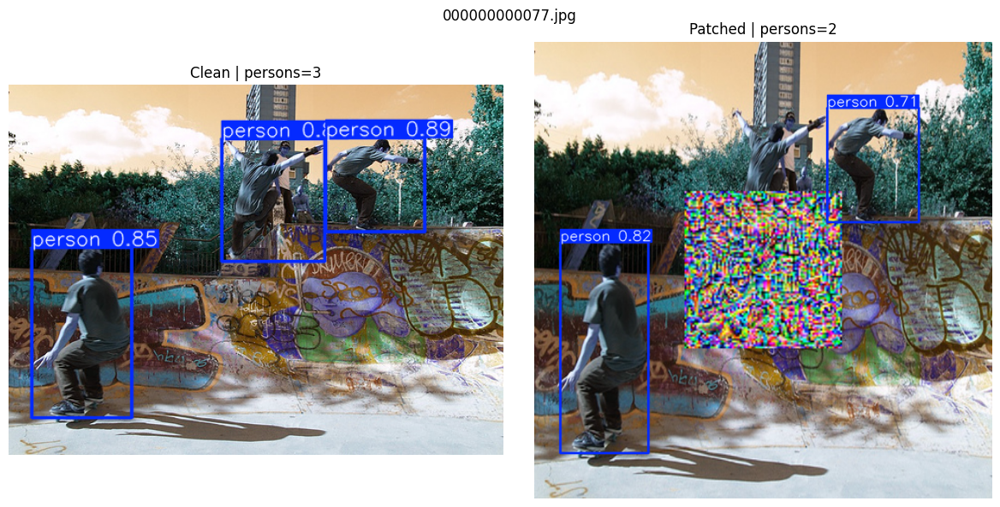

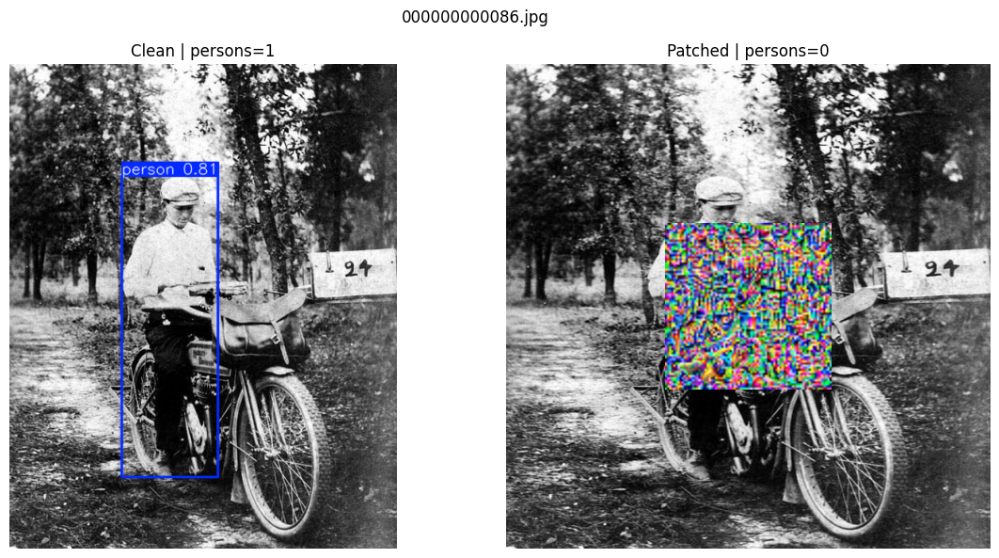

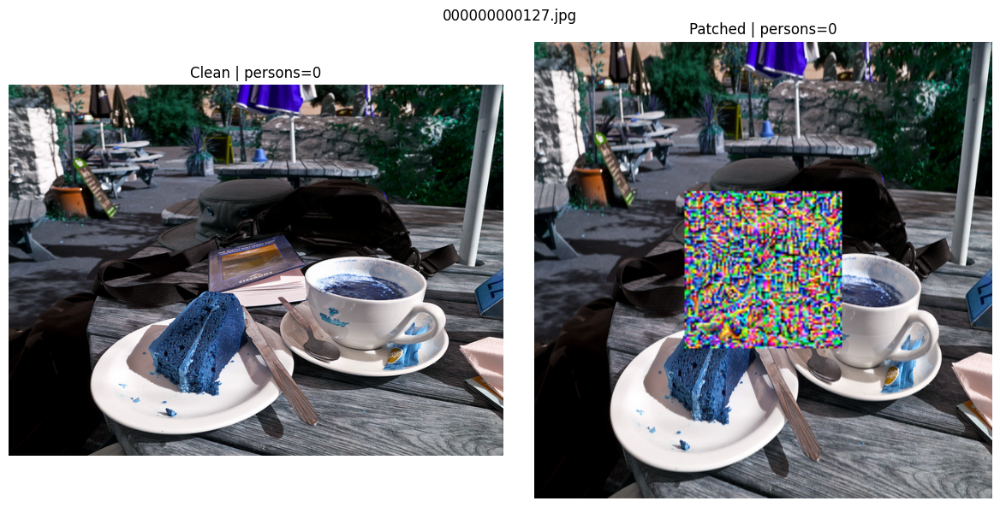

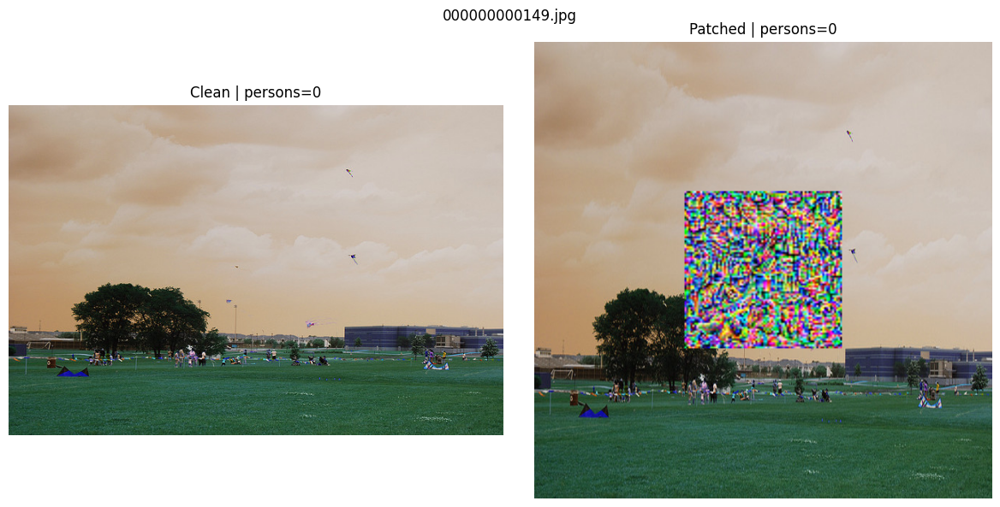

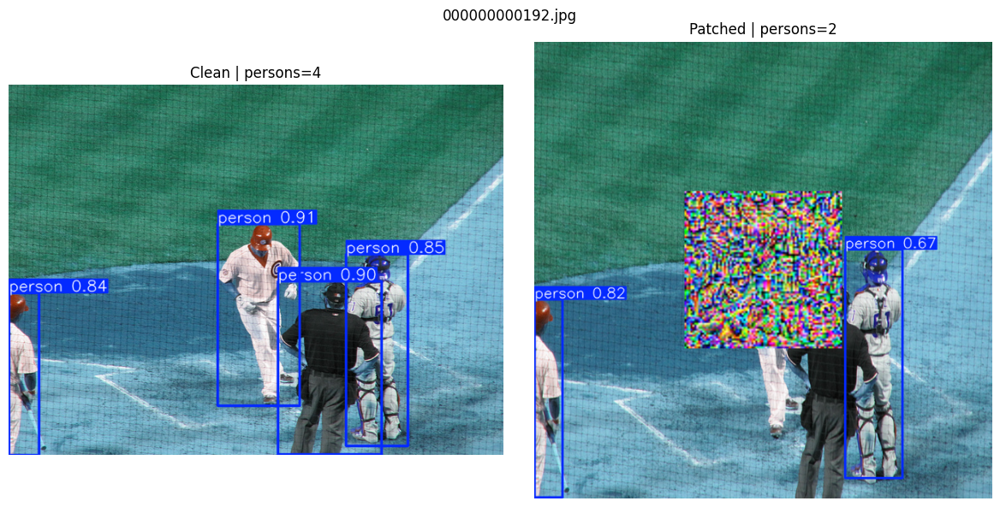

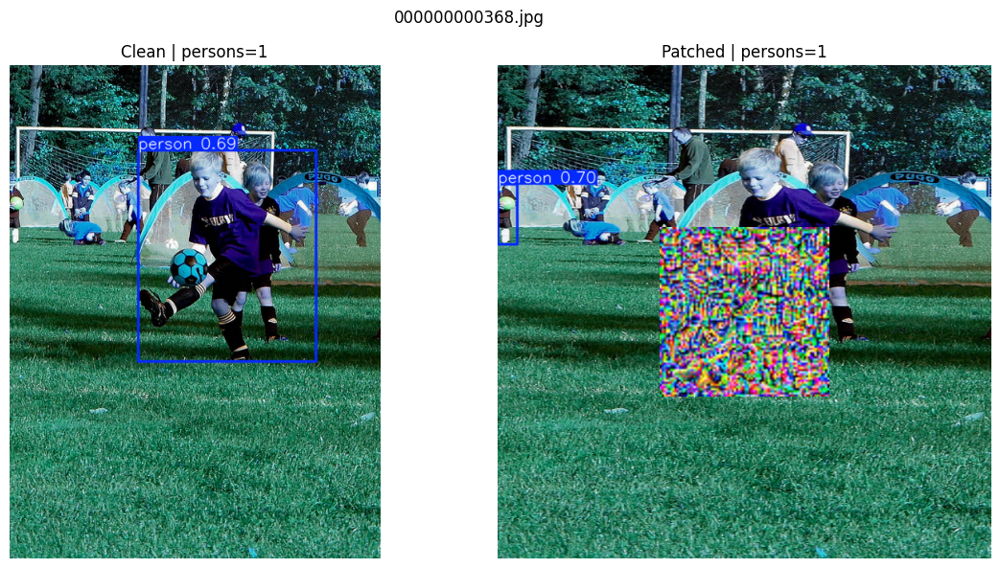

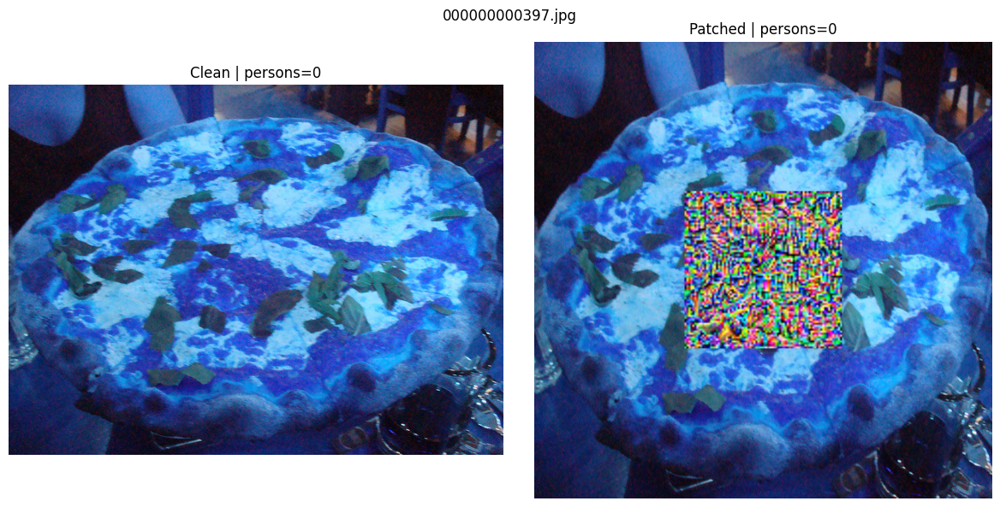

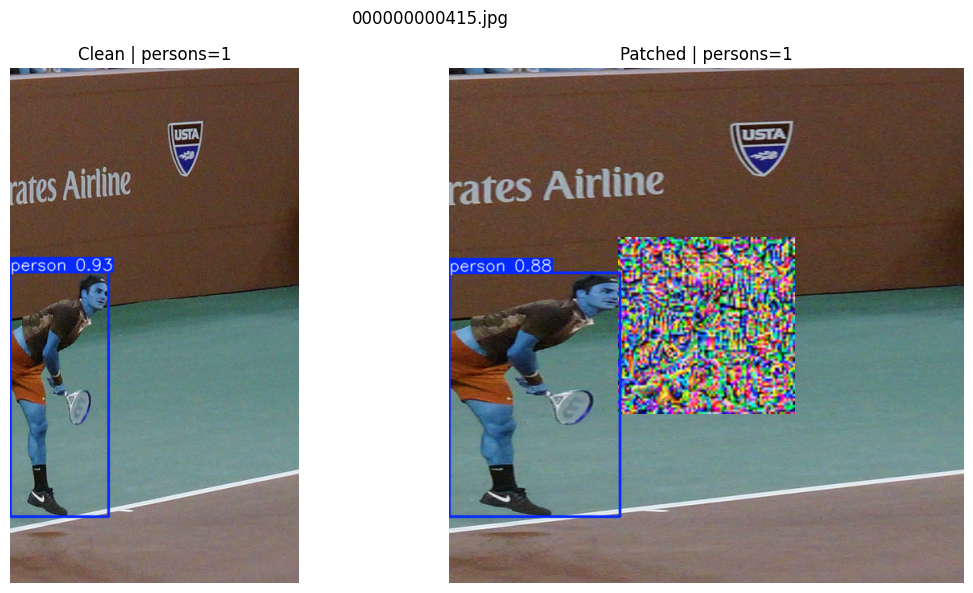

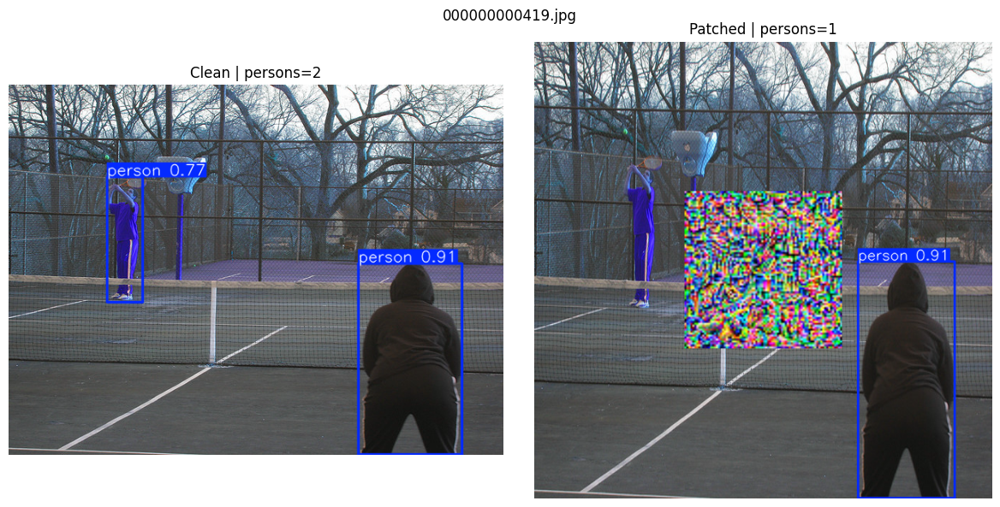

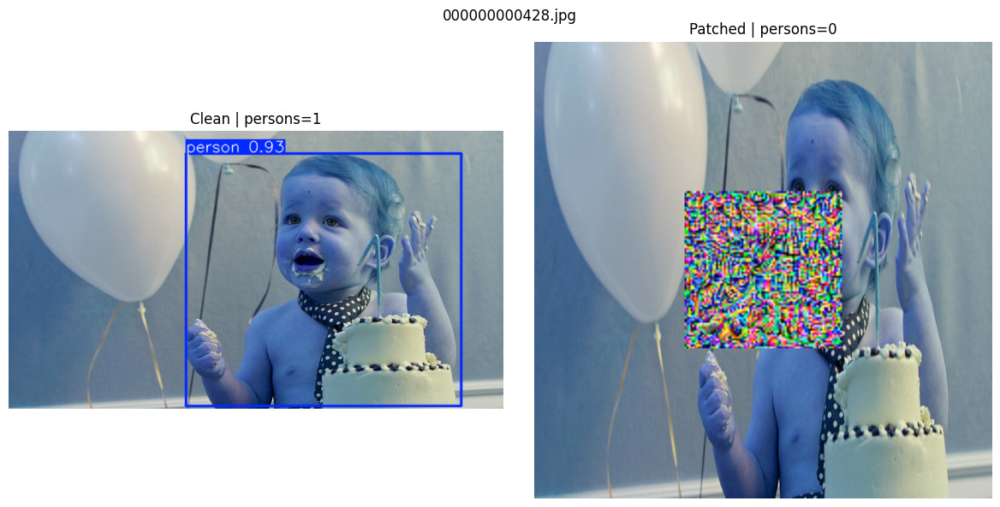

person counts (clean -> patched): [(3, 2), (1, 0), (0, 0), (0, 0), (4, 2), (1, 1), (0, 0), (1, 1), (2, 1), (1, 0)]
avg clean: 1.30 | avg patched: 0.70 | delta: -0.60


In [22]:
# --- quick eval + viz (ONLY PERSON detections) ---
import os, numpy as np, torch, torchvision.transforms as T
from PIL import Image
import matplotlib.pyplot as plt

CONF = 0.65
MAX_SHOW = 10
SAVE_DIR = None  # e.g. "/content/adv_eval"

def num_boxes(results) -> int:
    return 0 if getattr(results, "boxes", None) is None else int(len(results.boxes))

def to_uint8_hw3(t):
    return (t.permute(1,2,0).mul(255).clamp(0,255).byte().cpu().numpy())

# ---- pick patch & device safely ----
device = next(model.model.parameters()).device
if 'best_patch' in globals():
    patch_to_test = best_patch.detach().clamp(0,1).to(device)
elif 'patch' in globals():
    patch_to_test = patch.detach().clamp(0,1).to(device)
else:
    raise NameError("No 'patch' or 'best_patch' found in globals().")

# ---- model names -> PERSON_ID (dict or list) ----
model.model.eval()
names = model.model.names
if isinstance(names, dict):
    name_to_id = {v: k for k, v in names.items()}
else:  # list-like
    name_to_id = {v: i for i, v in enumerate(names)}
person_id = name_to_id["person"]
CLASSES = [person_id]  # only 'person'

def predict_and_plot(np_img, conf=CONF, classes=CLASSES):
    np_img = np.ascontiguousarray(np_img)
    if not np_img.flags.writeable:
        np_img = np_img.copy()
    r = model.predict(source=np_img, imgsz=640, device=device,
                      verbose=False, conf=conf, classes=classes)[0]
    viz_bgr = r.plot()
    return r, viz_bgr

# ---- paths ----
paths_all = dataset.paths if hasattr(dataset, "paths") else []
eval_paths = paths_all[:min(MAX_SHOW, len(paths_all))]
if SAVE_DIR: os.makedirs(SAVE_DIR, exist_ok=True)

resize, to_tensor = T.Resize((640, 640)), T.ToTensor()
pairs_person = []

for idx, pth in enumerate(eval_paths):
    pil = Image.open(pth).convert("RGB")

    # --- clean (persons only) ---
    r0, clean_viz_bgr = predict_and_plot(np.array(pil), conf=CONF, classes=CLASSES)
    n0_person = num_boxes(r0)

    # --- build patched image ---
    img_t = to_tensor(resize(pil)).to(device)

    # SAFE bbox_cache access (fallback to center paste if missing)
    bbox = None; orig_size = pil.size
    if 'bbox_cache' in globals() and isinstance(bbox_cache, dict):
        bbox, orig_size = bbox_cache.get(pth, (None, pil.size))

    if (bbox is not None) and ('overlay_patch_on_person_DIFF' in globals()):
        res = overlay_patch_on_person_DIFF(
            img_t, patch_to_test, bbox, orig_size,
            size_ratio_w=0.50, torso_rel_y=TORSO_REL_Y, soft_edge_frac=0.04
        )
        patched = res[0] if isinstance(res, (tuple, list)) else res
    else:
        # simple center paste fallback
        C,H,W = img_t.shape
        size = 220
        p = torch.nn.functional.interpolate(patch_to_test.unsqueeze(0), size=(size,size),
                                            mode='bilinear', align_corners=False)[0]
        y0 = (H-size)//2; x0 = (W-size)//2
        patched = img_t.clone()
        patched[:, y0:y0+size, x0:x0+size] = p

    patched_np = np.ascontiguousarray(to_uint8_hw3(patched))

    # --- patched (persons only) ---
    r1, patched_viz_bgr = predict_and_plot(patched_np, conf=CONF, classes=CLASSES)
    n1_person = num_boxes(r1)

    pairs_person.append((n0_person, n1_person))

    # --- side-by-side ---
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(clean_viz_bgr[..., ::-1]);  ax[0].set_title(f"Clean | persons={n0_person}");  ax[0].axis("off")
    ax[1].imshow(patched_viz_bgr[..., ::-1]); ax[1].set_title(f"Patched | persons={n1_person}"); ax[1].axis("off")
    plt.suptitle(os.path.basename(pth))
    plt.tight_layout()
    if SAVE_DIR:
        plt.savefig(os.path.join(SAVE_DIR, f"cmp_{idx:02d}_{os.path.basename(pth)}.png"), dpi=150)
    plt.show()

print("person counts (clean -> patched):", pairs_person)
if pairs_person:
    clean_avg = sum(a for a,b in pairs_person)/len(pairs_person)
    patch_avg = sum(b for a,b in pairs_person)/len(pairs_person)
    print(f"avg clean: {clean_avg:.2f} | avg patched: {patch_avg:.2f} | delta: {patch_avg - clean_avg:.2f}")
